In [1]:
!pip install numpy torch torchvision torchmetrics[image]

Defaulting to user installation because normal site-packages is not writeable


In [2]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.nn import functional as F
from torch.nn import Parameter as P
from torch.nn.utils import spectral_norm
from torch.utils.data import DataLoader
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import CIFAR100
from torchmetrics.image.fid import FrechetInceptionDistance
from torchmetrics.image.inception import InceptionScore
from torchvision.models.inception import inception_v3
from scipy.linalg import sqrtm
import os
import pickle
from tqdm import tqdm
import os
from PIL import Image
import os
os.environ["CUDA_LAUNCH_BLOCKING"] = "1"

SEED = 42

# Set seed for NumPy
np.random.seed(SEED)

# Set seed for PyTorch
torch.manual_seed(SEED)
torch.cuda.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

# Additional PyTorch settings for reproducibility
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Create a directory to save generated images
sample_dir = 'generated_samples'
os.makedirs(sample_dir, exist_ok=True)

In [3]:
superclass_mapping = {
    0: [4, 30, 55, 72, 95],  # aquatic mammals
    1: [1, 32, 67, 73, 91],  # fish
    2: [54, 62, 70, 82, 92],  # flowers
    3: [9, 10, 16, 28, 61],  # food containers
    4: [0, 51, 53, 57, 83],  # fruit and vegetables
    5: [22, 39, 40, 86, 87],  # household electrical devices
    6: [5, 20, 25, 84, 94],  # household furniture
    7: [6, 7, 14, 18, 24],  # insects
    8: [3, 42, 43, 88, 97],  # large carnivores
    9: [12, 17, 37, 68, 76],  # large man-made outdoor things
    10: [23, 33, 49, 60, 71],  # large natural outdoor scenes
    11: [15, 19, 21, 31, 38],  # large omnivores and herbivores
    12: [34, 63, 64, 66, 75],  # medium-sized mammals
    13: [26, 45, 77, 79, 99],  # non-insect invertebrates
    14: [2, 11, 35, 46, 98],  # people
    15: [27, 29, 44, 78, 93],  # reptiles
    16: [36, 50, 65, 74, 80],  # small mammals
    17: [47, 52, 56, 59, 96],  # trees
    18: [8, 13, 48, 58, 90],  # vehicles 1
    19: [41, 69, 81, 85, 89]   # vehicles 2
}

class_to_superclass = {
    49: 10, 33: 10, 72: 0, 51: 4, 71: 10, 92: 2, 15: 11, 14: 7, 23: 10,
    0: 4, 75: 12, 81: 19, 69: 19, 40: 5, 43: 8, 97: 8, 70: 2, 53: 4, 29: 15,
    21: 11, 16: 3, 39: 5, 8: 18, 20: 6, 61: 3, 41: 19, 93: 15, 56: 17, 73: 1,
    58: 18, 11: 14, 25: 6, 37: 9, 63: 12, 24: 7, 22: 5, 17: 9, 4: 0, 6: 7, 9: 3,
    57: 4, 2: 14, 32: 1, 52: 17, 42: 8, 77: 13, 27: 15, 65: 16, 7: 7, 35: 14, 82: 2,
    66: 12, 90: 18, 67: 1, 91: 1, 10: 3, 78: 15, 54: 2, 89: 19, 18: 7, 13: 18, 50: 16,
    26: 13, 83: 4, 47: 17, 95: 0, 76: 9, 59: 17, 85: 19, 19: 11, 46: 14, 1: 1, 74: 16,
    60: 10, 64: 12, 45: 13, 36: 16, 87: 5, 30: 0, 99: 13, 80: 16, 28: 3, 98: 14, 12: 9,
    94: 6, 68: 9, 44: 15, 31: 11, 79: 13, 34: 12, 55: 0, 62: 2, 96: 17, 84: 6, 38: 11,
    86: 5, 5: 6, 48: 18, 3: 8, 88: 8
}
superclass_to_class = {
    0: [72, 4, 95, 30, 55],
    1: [73, 32, 67, 91, 1],
    2: [92, 70, 82, 54, 62],
    3: [16, 61, 9, 10, 28],
    4: [51, 0, 53, 57, 83],
    5: [40, 39, 22, 87, 86],
    6: [20, 25, 94, 84, 5],
    7: [14, 24, 6, 7, 18],
    8: [43, 97, 42, 3, 88],
    9: [37, 17, 76, 12, 68],
    10: [49, 33, 71, 23, 60],
    11: [15, 21, 19, 31, 38],
    12: [75, 63, 66, 64, 34],
    13: [77, 26, 45, 99, 79],
    14: [11, 2, 35, 46, 98],
    15: [29, 93, 27, 78, 44],
    16: [65, 50, 74, 36, 80],
    17: [56, 52, 47, 59, 96],
    18: [8, 58, 90, 13, 48],
    19: [81, 69, 41, 89, 85]
}


In [4]:
def load_inception_net():
  inception_model = inception_v3(pretrained=True, transform_input=False)
  inception_model = WrapInception(inception_model.eval()).cuda()
  return inception_model

class WrapInception(nn.Module):
  def __init__(self, net):
    super(WrapInception,self).__init__()
    self.net = net
    self.mean = P(torch.tensor([0.485, 0.456, 0.406]).view(1, -1, 1, 1),
                  requires_grad=False)
    self.std = P(torch.tensor([0.229, 0.224, 0.225]).view(1, -1, 1, 1),
                 requires_grad=False)
  def forward(self, x):
    # Normalize x
    x = (x + 1.) / 2.0
    x = (x - self.mean) / self.std
    # Upsample if necessary
    if x.shape[2] != 299 or x.shape[3] != 299:
      x = F.interpolate(x, size=(299, 299), mode='bilinear', align_corners=True)
    # 299 x 299 x 3
    x = self.net.Conv2d_1a_3x3(x)
    # 149 x 149 x 32
    x = self.net.Conv2d_2a_3x3(x)
    # 147 x 147 x 32
    x = self.net.Conv2d_2b_3x3(x)
    # 147 x 147 x 64
    x = F.max_pool2d(x, kernel_size=3, stride=2)
    # 73 x 73 x 64
    x = self.net.Conv2d_3b_1x1(x)
    # 73 x 73 x 80
    x = self.net.Conv2d_4a_3x3(x)
    # 71 x 71 x 192
    x = F.max_pool2d(x, kernel_size=3, stride=2)
    # 35 x 35 x 192
    x = self.net.Mixed_5b(x)
    # 35 x 35 x 256
    x = self.net.Mixed_5c(x)
    # 35 x 35 x 288
    x = self.net.Mixed_5d(x)
    # 35 x 35 x 288
    x = self.net.Mixed_6a(x)
    # 17 x 17 x 768
    x = self.net.Mixed_6b(x)
    # 17 x 17 x 768
    x = self.net.Mixed_6c(x)
    # 17 x 17 x 768
    x = self.net.Mixed_6d(x)
    # 17 x 17 x 768
    x = self.net.Mixed_6e(x)
    # 17 x 17 x 768
    # 17 x 17 x 768
    x = self.net.Mixed_7a(x)
    # 8 x 8 x 1280
    x = self.net.Mixed_7b(x)
    # 8 x 8 x 2048
    x = self.net.Mixed_7c(x)
    # 8 x 8 x 2048
    pool = torch.mean(x.view(x.size(0), x.size(1), -1), 2)
    # 1 x 1 x 2048
    logits = self.net.fc(F.dropout(pool, training=False).view(pool.size(0), -1))
    # 1000 (num_classes)
    return pool, logits

def get_net_output(train_loader, net,device):
  pool, logits, labels = [], [], []

  for i, (x, y) in tqdm(enumerate(train_loader)):
      x = x.to(device)
      with torch.no_grad():
        pool_val, logits_val = net(x)
        pool += [pool_val]
        logits += [F.softmax(logits_val, 1)]
        labels += [y]
  pool = torch.cat(pool, 0)
  logits = torch.cat(logits, 0)
  labels = torch.cat(labels, 0)
  return pool, logits, labels

def calculate_fid(mu1, sigma1, mu2, sigma2):
    diff = mu1 - mu2
    covmean, _ = sqrtm(sigma1.dot(sigma2), disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    fid = diff.dot(diff) + np.trace(sigma1 + sigma2 - 2 * covmean)
    return fid

def calculate_inception_score(pred, num_splits=10):
  scores = []
  for index in range(num_splits):
    pred_chunk = pred[index * (pred.shape[0] // num_splits): (index + 1) * (pred.shape[0] // num_splits), :]
    kl_inception = pred_chunk * (np.log(pred_chunk) - np.log(np.expand_dims(np.mean(pred_chunk, 0), 0)))
    kl_inception = np.mean(np.sum(kl_inception, 1))
    scores.append(np.exp(kl_inception))
  return np.mean(scores), np.std(scores)

def calculate_intra_fid(pool, logits, labels, g_pool, g_logits, g_labels, chage_superclass=True):
  intra_fids = []
  super_class = super_class_mapping()

  super_labels = [super_class[i] for i in labels]
  super_labels = np.array(super_labels)
  print(super_labels.shape)

  if chage_superclass:
    g_super_labels = [super_class[i] for i in g_labels]
    g_super_labels = np.array(g_super_labels)
  else:
    g_super_labels = np.array(g_labels.cpu())

  for super_idx, _ in superclass_mapping.items():
    mask = (super_labels == super_idx)
    g_mask = (g_super_labels == super_idx)
    print(mask.shape)

    pool_low = pool[mask]
    g_pool_low = g_pool[g_mask]

    assert 2500 == len(g_pool_low), "super-classes count error"
    if len(pool_low) == 0 or len(g_pool_low) == 0:
      continue

    mu, sigma = np.mean(g_pool_low, axis=0), np.cov(g_pool_low, rowvar=False)
    mu_data, sigma_data = np.mean(pool_low, axis=0), np.cov(pool_low, rowvar=False)

    fid = calculate_fid(mu, sigma, mu_data, sigma_data)
    intra_fids.append(fid)

  return np.mean(intra_fids), intra_fids

def super_class_mapping():
  class_to_superclass = [None] * 100
  for super_idx, class_indices in superclass_mapping.items():
    for class_idx in class_indices:
      class_to_superclass[class_idx] = super_idx
  return class_to_superclass

In [5]:
BATCH_SIZE = 64
num_epochs = 100
learning_rate_G = 0.0001
learning_rate_D = 0.0002
nz = 128
num_classes = 20
image_size = 32
nc = 3
splits = 5
epsilon = 1e-7

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [6]:
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*nc, [0.5]*nc)
])

In [7]:
train_dataset = CIFAR100(root='./data', train=True, download=True, transform=transform)
test_dataset = CIFAR100(root='./data', train=False, download=True, transform=transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4, pin_memory=True)

Files already downloaded and verified
Files already downloaded and verified


In [8]:
def tensor_smoothening(onehot_tensor, labels, smooth_value=0.5) :
    smoothened_tensor = onehot_tensor.clone()

    for i, label in enumerate(labels) :
        superclass = class_to_superclass[label.item()]
        same_superclass_classes = superclass_to_class[superclass]

        for cls in same_superclass_classes:
            if cls != label:  # Avoid overwriting the target class value
                smoothened_tensor[i, cls] = smooth_value

    return smoothened_tensor

In [9]:
# Attention slightly works.

class Attention(nn.Module):
    def __init__(self, channels, reduction_attn=8, reduction_sc=2):
        super().__init__()
        self.channles_attn = channels // reduction_attn
        self.channels_sc = channels // reduction_sc

        self.conv_query = spectral_norm(nn.Conv2d(channels, self.channles_attn, kernel_size=1, bias=False))
        self.conv_key = spectral_norm(nn.Conv2d(channels, self.channles_attn, kernel_size=1, bias=False))
        self.conv_value = spectral_norm(nn.Conv2d(channels, self.channels_sc, kernel_size=1, bias=False))
        self.conv_attn = spectral_norm(nn.Conv2d(self.channels_sc, channels, kernel_size=1, bias=False))
        self.gamma = nn.Parameter(torch.zeros(1))

        nn.init.orthogonal_(self.conv_query.weight.data)
        nn.init.orthogonal_(self.conv_key.weight.data)
        nn.init.orthogonal_(self.conv_value.weight.data)
        nn.init.orthogonal_(self.conv_attn.weight.data)

    def forward(self, x):
        batch, _, h, w = x.size()

        proj_query = self.conv_query(x).view(batch, self.channles_attn, -1)
        proj_key = F.max_pool2d(self.conv_key(x), 2).view(batch, self.channles_attn, -1)

        attn = torch.bmm(proj_key.permute(0,2,1), proj_query)
        attn = F.softmax(attn, dim=1)

        proj_value = F.max_pool2d(self.conv_value(x), 2).view(batch, self.channels_sc, -1)
        attn = torch.bmm(proj_value, attn)
        attn = attn.view(batch, self.channels_sc, h, w)
        attn = self.conv_attn(attn)

        out = self.gamma * attn + x

        return out

In [10]:
# using label information works well.
# As for generator, it is realized by conditional batch normalization.

class CBN2d(nn.Module):
    def __init__(self, num_features, num_conditions):
        super().__init__()
        self.bn = nn.BatchNorm2d(num_features, affine=False)
        self.embed = spectral_norm(nn.Conv2d(num_conditions, num_features*2, kernel_size=1, bias=False))

        nn.init.orthogonal_(self.embed.weight.data)

    def forward(self, x, y):
        out = self.bn(x)
        embed = self.embed(y.unsqueeze(2).unsqueeze(3))
        gamma, beta = embed.chunk(2, dim=1)
        out = (1.0 + gamma) * out + beta

        return out

In [11]:
# residual block improves convergence speed and generated image's quality.
# nearest upsampling is better than others.

class GBlock(nn.Module):
    def __init__(self, in_channels, out_channels, num_conditions, upsample=False):
        super().__init__()
        self.upsample = upsample
        self.learnable_sc = in_channels != out_channels or upsample

        self.conv1 = spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False))
        self.conv2 = spectral_norm(nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False))
        self.cbn1 = CBN2d(in_channels, num_conditions)
        self.cbn2 = CBN2d(out_channels, num_conditions)
        if self.learnable_sc:
            self.conv_sc = spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False))
        self.relu = nn.ReLU()

        nn.init.orthogonal_(self.conv1.weight.data)
        nn.init.orthogonal_(self.conv2.weight.data)
        if self.learnable_sc:
            nn.init.orthogonal_(self.conv_sc.weight.data)

    def _upsample_conv(self, x, conv):
        x = F.interpolate(x, scale_factor=2, mode='bilinear')
        x = conv(x)

        return x

    def _residual(self, x, y):
        x = self.relu(self.cbn1(x, y))
        x = self._upsample_conv(x, self.conv1) if self.upsample else self.conv1(x)
        x = self.relu(self.cbn2(x, y))
        x = self.conv2(x)

        return x

    def _shortcut(self, x):
        if self.learnable_sc:
            x = self._upsample_conv(x, self.conv_sc) if self.upsample else self.conv_sc(x)

        return x

    def forward(self, x, y):
        return self._shortcut(x) + self._residual(x, y)

In [12]:
# shared embedding of class labels, and hierarchical latent noise, work well.
# this architecture is the same as BigGAN except for channel size.

class Generator(nn.Module):
    def __init__(self, latent_dim=128, ch=32, num_classes=20, embed_dim=128, use_attn=False):
        super().__init__()
        self.latent_dim = latent_dim
        self.ch = ch
        self.num_classes = num_classes
        self.embed_dim = embed_dim
        self.use_attn = use_attn
        self.num_chunk = 5
        num_latents = self.__get_num_latents()

        self.embed = nn.Embedding(num_classes, embed_dim)
        self.fc = spectral_norm(nn.Linear(num_latents[0], ch*8*4*4, bias=False))
        self.block1 = GBlock(ch*8, ch*8, num_latents[1], upsample=True)
        self.block2 = GBlock(ch*8, ch*4, num_latents[2], upsample=True)
        self.block3 = GBlock(ch*4, ch*2, num_latents[3], upsample=True)
        if use_attn:
            self.attn = Attention(ch*2)
        self.block4 = GBlock(ch*2, ch, num_latents[4], upsample=False)
        self.bn = nn.BatchNorm2d(ch)
        self.relu = nn.ReLU()
        self.conv_last = spectral_norm(nn.Conv2d(ch, 3, kernel_size=3, padding=1, bias=False))
        self.tanh = nn.Tanh()

        nn.init.orthogonal_(self.embed.weight.data)
        nn.init.orthogonal_(self.conv_last.weight.data)
        nn.init.constant_(self.bn.weight.data, 1.0)
        nn.init.constant_(self.bn.bias.data, 0.0)

    def __get_num_latents(self):
        xs = torch.empty(self.latent_dim).chunk(self.num_chunk)
        num_latents = [x.size(0) for x in xs]
        for i in range(1, self.num_chunk):
            num_latents[i] += self.embed_dim

        return num_latents

    def forward(self, x, y):
        xs = x.chunk(self.num_chunk, dim=1)
        y = self.embed(y)

        h = self.fc(xs[0])
        h = h.view(h.size(0), self.ch*8, 4, 4)
        h = self.block1(h, torch.cat([y, xs[1]], dim=1))
        h = self.block2(h, torch.cat([y, xs[2]], dim=1))
        h = self.block3(h, torch.cat([y, xs[3]], dim=1))
        if self.use_attn:
            h = self.attn(h)
        h = self.block4(h, torch.cat([y, xs[4]], dim=1))
        h = self.relu(self.bn(h))
        out = self.tanh(self.conv_last(h))

        return out

In [13]:
# residual block improves convergence speed and generated image's quality.

class DBlock(nn.Module):
    def __init__(self, in_channels, out_channels, downsample=False, optimized=False):
        super().__init__()
        self.downsample = downsample
        self.optimized = optimized
        self.learnable_sc = in_channels != out_channels or downsample

        self.conv1 = spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False))
        self.conv2 = spectral_norm(nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False))
        if self.learnable_sc:
            self.conv_sc = spectral_norm(nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False))
        self.relu = nn.ReLU()

        nn.init.orthogonal_(self.conv1.weight.data)
        nn.init.orthogonal_(self.conv2.weight.data)
        if self.learnable_sc:
            nn.init.orthogonal_(self.conv_sc.weight.data)

    def _residual(self, x):
        if not self.optimized:
            x = self.relu(x)
        x = self.conv1(x)
        x = self.relu(x)
        x = self.conv2(x)
        if self.downsample:
            x = F.avg_pool2d(x, 2)

        return x

    def _shortcut(self, x):
        if self.learnable_sc:
            if self.optimized:
                x = self.conv_sc(F.avg_pool2d(x, 2)) if self.downsample else self.conv_sc(x)
            else:
                x = F.avg_pool2d(self.conv_sc(x), 2) if self.downsample else self.conv_sc(x)

        return x

    def forward(self, x):
        return self._shortcut(x) + self._residual(x)

In [14]:
class Discriminator(nn.Module):
    def __init__(self, ch=32, num_classes=20, use_attn=False):
        super().__init__()
        self.ch = ch
        self.num_classes = num_classes
        self.use_attn = use_attn

        self.block1 = DBlock(3, ch, downsample=True, optimized=True)
        self.block2 = DBlock(ch, ch*2, downsample=True)
        self.block3 = DBlock(ch*2, ch*4, downsample=True)
        self.block4 = DBlock(ch*4, ch*8, downsample=True)
        self.block5 = DBlock(ch*8+1, ch*8, downsample=False)
        self.attn1 = Attention(ch)
        self.attn2 = Attention(ch*2)
        self.attn3 = Attention(ch*4)
        self.attn4 = Attention(ch*8)
        self.relu = nn.ReLU()
        self.fc = spectral_norm(nn.Linear(ch*8, 1, bias=False))
        self.embed = spectral_norm(nn.Embedding(num_classes, ch*8))
        self.clf = spectral_norm(nn.Linear(ch*8, num_classes, bias=False))

        nn.init.orthogonal_(self.fc.weight.data)
        nn.init.orthogonal_(self.embed.weight.data)
        nn.init.orthogonal_(self.clf.weight.data)

    def minibatch_stddev(self, x, group_size=4, eps=1e-8):
        shape = x.size()
        y = x.view(group_size, -1, shape[1], shape[2], shape[3])
        y = y - torch.mean(y, dim=0, keepdim=True)
        y = torch.mean(y.pow(2), dim=0)
        y = torch.sqrt(y + eps)
        y = torch.mean(y, dim=[1,2,3], keepdim=True)
        y = y.repeat(group_size, 1, shape[2], shape[3])

        return torch.cat([x, y], dim=1)

    def forward(self, x, y):
        h = self.block1(x)
        if self.use_attn:
            h = self.attn1(h)
        h = self.block2(h)
        h = self.block3(h)
        h = self.block4(h)
        h = self.block5(self.minibatch_stddev(h))
        h = self.relu(h)
        h = torch.sum(h, dim=(2,3))

        out = self.fc(h)
        out += torch.sum(self.embed(y)*h, dim=1, keepdim=True)

        ac = self.clf(h)
        ac = F.log_softmax(ac, dim=1)

        return out, ac

In [15]:
netG = Generator(latent_dim=nz, num_classes=num_classes, ch=64, use_attn=True).to(device)
netD = Discriminator(num_classes=num_classes, ch=64, use_attn=True).to(device)

In [16]:
criterion_class = nn.NLLLoss().to(device, torch.float32)
optimizerD = optim.Adam(netD.parameters(), lr=learning_rate_D, betas=(0.0, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=learning_rate_G, betas=(0.0, 0.999))

schedulerD = torch.optim.lr_scheduler.MultiStepLR(optimizerD, milestones=[30, 60, 90], gamma=0.5)
schedulerG = torch.optim.lr_scheduler.MultiStepLR(optimizerG, milestones=[30, 60, 90], gamma=0.5)

inception_model = load_inception_net()

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [17]:
def train(
    netG,
    netD,
    epoch,
    train_loader,
    optimizerD,
    optimizerG,
    device
) :
    netG.train()
    netD.train()
    d_losses = 0
    g_losses = 0
    losses = 0
    fids = 0
    intra_fids = 0
    inception_scores = 0
    inception_scores_std = 0

    real_images_concat = []
    fake_images_concat = []
    labels_concat = []

    for real_images, labels in tqdm(train_loader) :
        batch_size = real_images.size(0)
        real_images = real_images.to(device)
        real_labels = labels.to(device)
        super_labels = torch.tensor([class_to_superclass[x] for x in real_labels.cpu().numpy()], device=device)

        noise = torch.randn(batch_size, nz, device=device)
        fake_labels = torch.randint(0, num_classes, (batch_size,), device=device)
        fake_images = netG(noise, fake_labels)

        real_logits, real_class_logits = netD(real_images, super_labels)
        fake_logits, fake_class_logits = netD(fake_images.detach(), fake_labels)

        d_real_mean = real_logits.mean()
        d_fake_mean = fake_logits.mean()

        # Relativistic Average Least Squares Loss for Discriminator
        d_loss_real = torch.mean((real_logits - d_fake_mean - 1) ** 2)
        d_loss_fake = torch.mean((fake_logits - d_real_mean + 1) ** 2)
        d_loss_rals = 0.5 * (d_loss_real + d_loss_fake)

        d_loss_class_real = criterion_class(real_class_logits, super_labels)
        d_loss_class_fake = criterion_class(fake_class_logits, fake_labels)

        d_loss = d_loss_rals + d_loss_class_real + d_loss_class_fake

        optimizerD.zero_grad()
        d_loss.backward()
        optimizerD.step()

        fake_images = netG(noise, fake_labels)
        fake_logits, fake_class_logits = netD(fake_images, fake_labels)

        # Compute generator loss
        g_loss_real = torch.mean((fake_logits - d_real_mean.detach() - 1) ** 2)
        g_loss_fake = torch.mean((real_logits.detach() - d_fake_mean.detach() + 1) ** 2)
        g_loss_rals = 0.5 * (g_loss_real + g_loss_fake)

        g_loss_class = criterion_class(fake_class_logits, fake_labels)

        g_loss = g_loss_rals + g_loss_class

        optimizerG.zero_grad()
        g_loss.backward()  # No need for retain_graph=True
        optimizerG.step()

        losses += g_loss.item() + d_loss.item()
        d_losses += d_loss.item()
        g_losses += g_loss.item()

        real_images_concat.append(real_images)
        fake_images_concat.append(fake_images)
        labels_concat.append(labels)

    real_images_concat = torch.cat(real_images_concat, 0)
    fake_images_concat = torch.cat(fake_images_concat, 0)
    labels_concat = torch.cat(labels_concat, 0)

    hat_dataloader = DataLoader(torch.utils.data.TensorDataset(fake_images_concat, labels_concat), batch_size=BATCH_SIZE, shuffle=False)

    pool_val, logits_val, labels_val = get_net_output(train_loader, inception_model, device)
    pool_hat, logits_hat, labels_hat = get_net_output(hat_dataloader, inception_model, device)
    fid = calculate_fid(np.mean(pool_val.cpu().numpy()), np.cov(pool_val.cpu().numpy(), rowvar=False), np.mean(pool_hat.cpu().numpy(), axis=0), np.cov(pool_hat.cpu().numpy(), rowvar=False))
    inception_score_mean, inception_score_std = calculate_inception_score(logits_hat.cpu().numpy())

    d_losses /= len(train_loader)
    g_losses /= len(train_loader)
    losses /= len(train_loader)

    torchvision.utils.save_image(
        fake_images_concat[:50],
        os.path.join(sample_dir, f'epoch_{epoch}.png'),
        nrow=10,  # Number of images per row in the grid
        normalize=True,
        value_range=(-1, 1),  # Adjust range to match your generator's output
    )
    print(f'Epoch {epoch}')
    print(f'Loss Total : {losses} \t\t Loss D : {d_losses} \t\t Loss G : {g_losses} \t\t FID : {fid} \t\t Inception Score : {inception_score_mean} ({inception_score_std})')
    return losses, fid, inception_score_mean, inception_score_std

In [18]:
# 定义反标准化函数
def denormalize_image(img):
    img = (img + 1) * 0.5  # 将 [-1,1] 转换为 [0,1]
    img = img * 255  # 将 [0,1] 转换为 [0,255]
    img = img.clamp(0, 255).byte()  # 转换为 uint8
    return img

def test(netG, netD, dataloader, device) :
    netG.eval()
    netD.eval()
    losses = 0

    generated_images = []
    generated_labels = []
    real_images_concat = []
    real_labels_concat = []
    for real_images, labels in tqdm(dataloader) :
        batch_size = real_images.size(0)
        real_images = real_images.to(device)
        labels = labels.to(device)
        super_labels = torch.tensor([class_to_superclass[x] for x in labels.cpu().numpy()], device=device)

        with torch.no_grad() :
            noise = torch.randn(batch_size, nz, device=device)
            fake_images = netG(noise, super_labels)

        generated_images.append(fake_images.detach())
        generated_labels.append(labels.detach())
        real_images_concat.append(real_images.detach())
        real_labels_concat.append(labels.detach())

    generated_images = torch.cat(generated_images, 0)
    generated_labels = torch.cat(generated_labels, 0)
    # generated_images = denormalize_image(generated_images)

    real_images_concat = torch.cat(real_images_concat, 0)
    real_labels_concat = torch.cat(real_labels_concat, 0)
    # real_images_concat = denormalize_image(real_images_concat)

    val_dataloader = DataLoader(torch.utils.data.TensorDataset(generated_images, generated_labels), batch_size=BATCH_SIZE, shuffle=False)
    dataloader = DataLoader(torch.utils.data.TensorDataset(real_images_concat, real_labels_concat), batch_size=BATCH_SIZE, shuffle=False)
    inception_model = load_inception_net().to(device)
    print('Inception Extraction on Prediction')
    pool_hat, logits_hat, labels_hat = get_net_output(val_dataloader, inception_model, device)
    print('Inception Extraction on Validation')
    pool_val, logits_val, labels_val = get_net_output(dataloader, inception_model, device)
    fid = calculate_fid(np.mean(pool_val.cpu().numpy(), axis=0), np.cov(pool_val.cpu().numpy(), rowvar=False), np.mean(pool_hat.cpu().numpy(), axis=0), np.cov(pool_hat.cpu().numpy(), rowvar=False))
    inception_score_mean, inception_score_std = calculate_inception_score(logits_hat.cpu().numpy())
    intra_fid_mean, intra_fid = calculate_intra_fid(pool_val.cpu().numpy(), logits_val, generated_labels, pool_hat.cpu().numpy(), logits_hat.cpu().numpy(), generated_labels)
    intra_fid_std = np.std(intra_fid)
    metrics = {
        'FID' : fid,
        'Inception Score' : inception_score_mean,
        'Inception Score Std' : inception_score_std,
        'Intra-FID Mean' : intra_fid_mean,
        'Intra-FID Std' : intra_fid_std
    }
    return metrics, intra_fid

100%|█████████████████████████████████████████| 782/782 [07:03<00:00,  1.85it/s]
782it [00:52, 14.94it/s]
782it [01:05, 12.00it/s]


Epoch 1
Loss Total : 9.476265126481994 		 Loss D : 4.750776321686748 		 Loss G : 4.725488804795248 		 FID : 230.52181935971385 		 Inception Score : 2.3739185333251953 (0.3424997627735138)


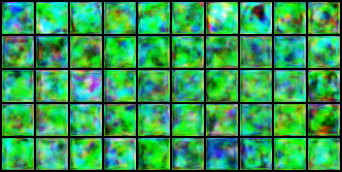

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.75it/s]
782it [01:07, 11.62it/s]


Epoch 2
Loss Total : 7.990491449680475 		 Loss D : 3.8754811216803158 		 Loss G : 4.115010328000159 		 FID : 178.78396950329724 		 Inception Score : 3.076524019241333 (0.23541642725467682)


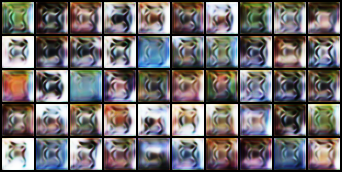

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:53, 14.64it/s]
782it [01:07, 11.60it/s]


Epoch 3
Loss Total : 7.580428929280137 		 Loss D : 3.638315784351905 		 Loss G : 3.942113144928232 		 FID : 158.55673328509707 		 Inception Score : 3.8000125885009766 (0.12297701835632324)


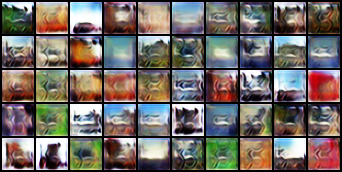

100%|█████████████████████████████████████████| 782/782 [07:09<00:00,  1.82it/s]
782it [00:53, 14.72it/s]
782it [01:07, 11.61it/s]


Epoch 4
Loss Total : 7.246944247914092 		 Loss D : 3.4269323775835354 		 Loss G : 3.820011870330557 		 FID : 161.48538568952108 		 Inception Score : 3.8307552337646484 (0.13074640929698944)


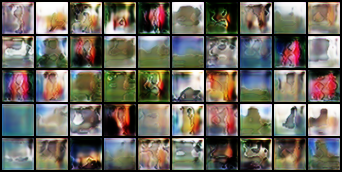

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:53, 14.59it/s]
782it [01:07, 11.52it/s]


Epoch 5
Loss Total : 7.012391229419757 		 Loss D : 3.2529568897793664 		 Loss G : 3.7594343396403906 		 FID : 156.27735252478396 		 Inception Score : 4.005256652832031 (0.10616224259138107)


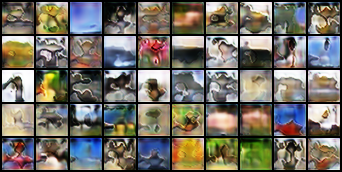

100%|█████████████████████████████████████████| 782/782 [07:09<00:00,  1.82it/s]
782it [00:53, 14.49it/s]
782it [01:07, 11.55it/s]


Epoch 6
Loss Total : 6.86289477378816 		 Loss D : 3.134884149827006 		 Loss G : 3.7280106239611537 		 FID : 151.81268031421723 		 Inception Score : 4.156468391418457 (0.14233435690402985)


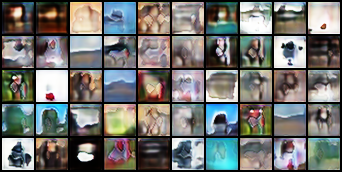

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.82it/s]
782it [00:54, 14.48it/s]
782it [01:08, 11.47it/s]


Epoch 7
Loss Total : 6.713125600229444 		 Loss D : 3.0123038813281244 		 Loss G : 3.7008217189013197 		 FID : 144.08941797598737 		 Inception Score : 4.383906364440918 (0.1393628567457199)


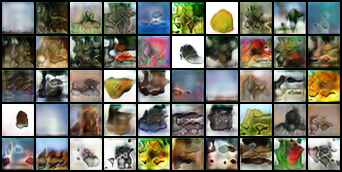

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.82it/s]
782it [00:53, 14.60it/s]
782it [01:07, 11.52it/s]


Epoch 8
Loss Total : 6.588031758432803 		 Loss D : 2.911488603143131 		 Loss G : 3.676543155289672 		 FID : 137.79760676205456 		 Inception Score : 4.46599006652832 (0.13566391170024872)


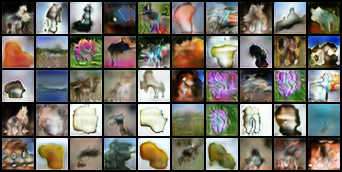

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.65it/s]
782it [01:07, 11.57it/s]


Epoch 9
Loss Total : 6.485024778434383 		 Loss D : 2.843178505177998 		 Loss G : 3.6418462732563848 		 FID : 130.65168048528304 		 Inception Score : 4.629693031311035 (0.0799546092748642)


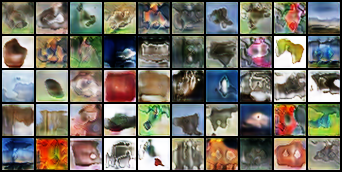

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.82it/s]
782it [00:53, 14.66it/s]
782it [01:07, 11.62it/s]


Epoch 10
Loss Total : 6.371909831795851 		 Loss D : 2.7800951802822027 		 Loss G : 3.5918146515136486 		 FID : 127.2487089832542 		 Inception Score : 4.756446838378906 (0.08609513938426971)


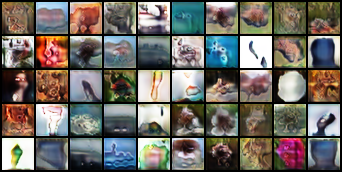

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.70it/s]
782it [01:07, 11.63it/s]


Epoch 11
Loss Total : 6.286113756696891 		 Loss D : 2.688543018172769 		 Loss G : 3.5975707385241225 		 FID : 121.72115175288567 		 Inception Score : 4.786790370941162 (0.09332427382469177)


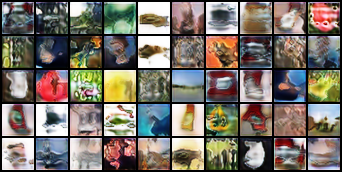

100%|█████████████████████████████████████████| 782/782 [07:05<00:00,  1.84it/s]
782it [00:53, 14.67it/s]
782it [01:07, 11.64it/s]


Epoch 12
Loss Total : 6.209546400762885 		 Loss D : 2.616325848852582 		 Loss G : 3.593220551910303 		 FID : 121.6678062234181 		 Inception Score : 4.949210166931152 (0.20968294143676758)


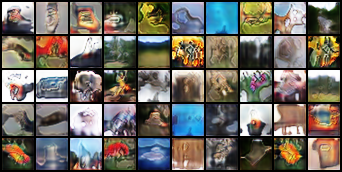

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.59it/s]
782it [01:07, 11.61it/s]


Epoch 13
Loss Total : 6.132156014442444 		 Loss D : 2.5575035892789018 		 Loss G : 3.574652425163542 		 FID : 116.32565762672851 		 Inception Score : 5.072145938873291 (0.10791729390621185)


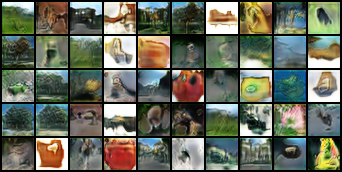

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:54, 14.47it/s]
782it [01:07, 11.53it/s]


Epoch 14
Loss Total : 6.093511601085858 		 Loss D : 2.536504475204536 		 Loss G : 3.557007125881322 		 FID : 116.18816904338183 		 Inception Score : 5.182114124298096 (0.09774229675531387)


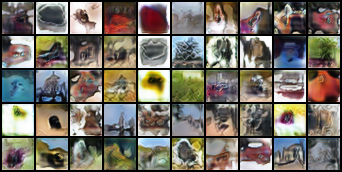

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.53it/s]
782it [01:08, 11.48it/s]


Epoch 15
Loss Total : 6.026438600266986 		 Loss D : 2.481682460631251 		 Loss G : 3.544756139635735 		 FID : 116.61192924745207 		 Inception Score : 5.257888317108154 (0.1251523643732071)


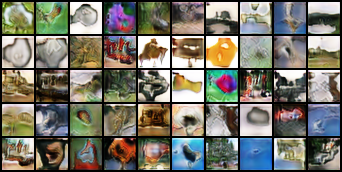

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.67it/s]
782it [01:07, 11.57it/s]


Epoch 16
Loss Total : 5.948482921818638 		 Loss D : 2.401084954628859 		 Loss G : 3.547397967189779 		 FID : 116.85146782431922 		 Inception Score : 5.340489387512207 (0.10853162407875061)


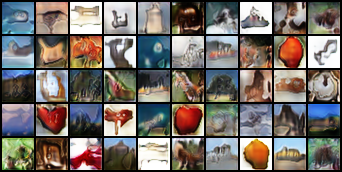

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:53, 14.67it/s]
782it [01:07, 11.56it/s]


Epoch 17
Loss Total : 5.888504383204233 		 Loss D : 2.3357455901172766 		 Loss G : 3.552758793086957 		 FID : 115.54064600693016 		 Inception Score : 5.299260139465332 (0.1163482740521431)


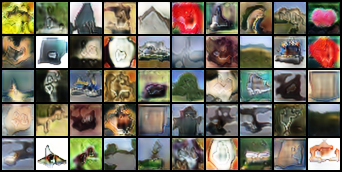

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:53, 14.61it/s]
782it [01:07, 11.57it/s]


Epoch 18
Loss Total : 5.820463934822765 		 Loss D : 2.297164684366387 		 Loss G : 3.5232992504563785 		 FID : 114.4179018001367 		 Inception Score : 5.391395092010498 (0.12301424145698547)


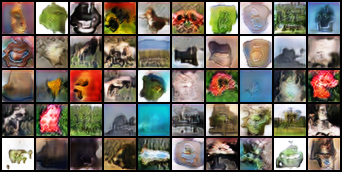

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:53, 14.62it/s]
782it [01:07, 11.64it/s]


Epoch 19
Loss Total : 5.777755763677075 		 Loss D : 2.267350912246558 		 Loss G : 3.5104048514305175 		 FID : 110.59014453064572 		 Inception Score : 5.438261032104492 (0.12247370183467865)


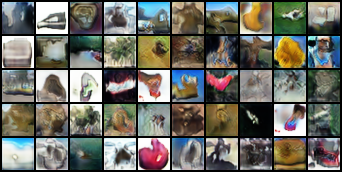

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.61it/s]
782it [01:07, 11.61it/s]


Epoch 20
Loss Total : 5.7363109585574215 		 Loss D : 2.2300834024653717 		 Loss G : 3.50622755609205 		 FID : 109.65118580089771 		 Inception Score : 5.569884300231934 (0.14795748889446259)


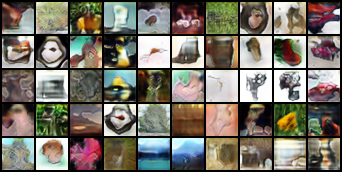

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.50it/s]
782it [01:07, 11.54it/s]


Epoch 21
Loss Total : 5.670799265737119 		 Loss D : 2.1550001247459667 		 Loss G : 3.5157991409911524 		 FID : 110.35585661973242 		 Inception Score : 5.615976810455322 (0.16015781462192535)


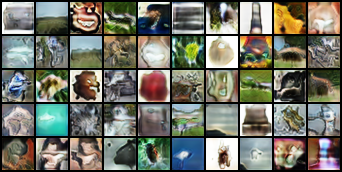

100%|█████████████████████████████████████████| 782/782 [07:09<00:00,  1.82it/s]
782it [00:53, 14.56it/s]
782it [01:07, 11.50it/s]


Epoch 22
Loss Total : 5.638661250129076 		 Loss D : 2.114412609268637 		 Loss G : 3.524248640860438 		 FID : 112.07707340443 		 Inception Score : 5.51871395111084 (0.1060715764760971)


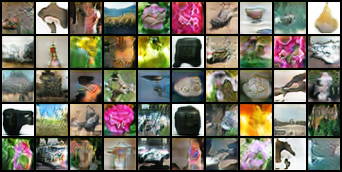

100%|█████████████████████████████████████████| 782/782 [07:05<00:00,  1.84it/s]
782it [00:53, 14.62it/s]
782it [01:07, 11.57it/s]


Epoch 23
Loss Total : 5.624103718706409 		 Loss D : 2.08927068045682 		 Loss G : 3.534833038249589 		 FID : 110.35067178417111 		 Inception Score : 5.610912799835205 (0.08457229286432266)


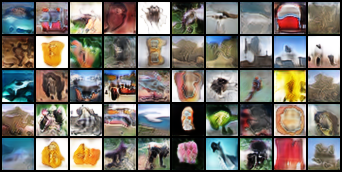

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.61it/s]
782it [01:07, 11.60it/s]


Epoch 24
Loss Total : 5.572096734095718 		 Loss D : 2.0708359540880794 		 Loss G : 3.501260780007638 		 FID : 108.68680260130347 		 Inception Score : 5.662859916687012 (0.053283724933862686)


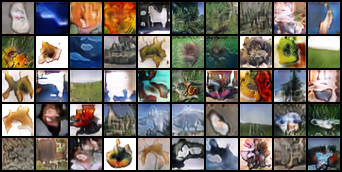

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.73it/s]
782it [01:07, 11.64it/s]


Epoch 25
Loss Total : 5.530129367128358 		 Loss D : 2.0152547078974106 		 Loss G : 3.514874659230947 		 FID : 109.74443268682464 		 Inception Score : 5.644784927368164 (0.1050691157579422)


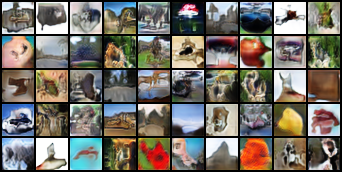

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.82it/s]
782it [00:53, 14.67it/s]
782it [01:07, 11.62it/s]


Epoch 26
Loss Total : 5.4985201715508385 		 Loss D : 1.9924711187172424 		 Loss G : 3.506049052833596 		 FID : 108.5036639867786 		 Inception Score : 5.712241172790527 (0.08627384901046753)


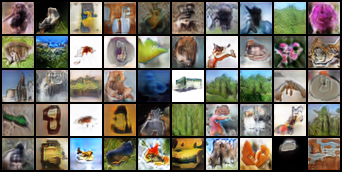

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.71it/s]
782it [01:07, 11.54it/s]


Epoch 27
Loss Total : 5.465157005183228 		 Loss D : 1.9704597502413308 		 Loss G : 3.4946972549418964 		 FID : 107.42545009141404 		 Inception Score : 5.761338233947754 (0.14366647601127625)


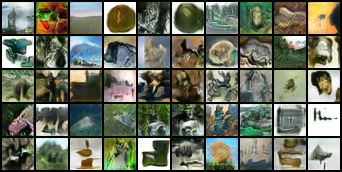

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.61it/s]
782it [01:07, 11.61it/s]


Epoch 28
Loss Total : 5.433034876118535 		 Loss D : 1.9175807481531597 		 Loss G : 3.5154541279653757 		 FID : 107.04086740488668 		 Inception Score : 5.876718997955322 (0.1552855521440506)


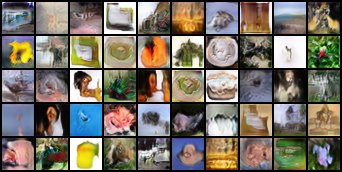

100%|█████████████████████████████████████████| 782/782 [07:09<00:00,  1.82it/s]
782it [00:53, 14.69it/s]
782it [01:07, 11.60it/s]


Epoch 29
Loss Total : 5.422886795095166 		 Loss D : 1.8925129656901445 		 Loss G : 3.530373829405021 		 FID : 107.94637149786783 		 Inception Score : 5.786602020263672 (0.14512623846530914)


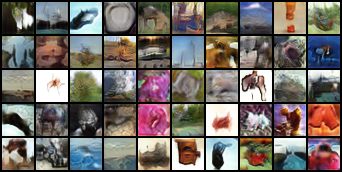

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.60it/s]
782it [01:07, 11.63it/s]


Epoch 30
Loss Total : 5.380850572110442 		 Loss D : 1.8423309201169806 		 Loss G : 3.5385196519934614 		 FID : 106.1684826303061 		 Inception Score : 5.874611854553223 (0.08426253497600555)


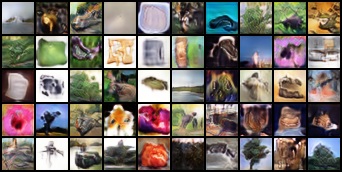

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:53, 14.66it/s]
782it [01:07, 11.62it/s]


Epoch 31
Loss Total : 5.047707727040781 		 Loss D : 1.5475335619638644 		 Loss G : 3.500174165076917 		 FID : 105.42128990220397 		 Inception Score : 5.9478230476379395 (0.1326119601726532)


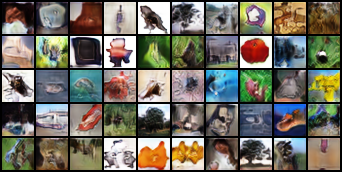

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.70it/s]
782it [01:07, 11.63it/s]


Epoch 32
Loss Total : 5.021893295028326 		 Loss D : 1.542835527521265 		 Loss G : 3.47905776750706 		 FID : 104.4539213870963 		 Inception Score : 5.977685451507568 (0.06667177379131317)


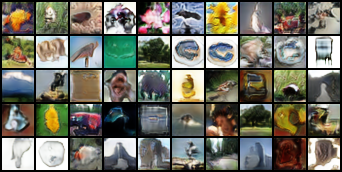

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.62it/s]
782it [01:07, 11.64it/s]


Epoch 33
Loss Total : 5.002107005137617 		 Loss D : 1.5385767107119646 		 Loss G : 3.4635302944256523 		 FID : 105.30171226391568 		 Inception Score : 5.979153633117676 (0.13792654871940613)


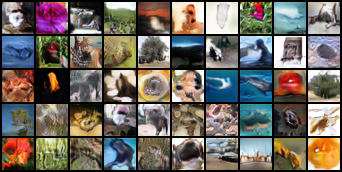

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:53, 14.65it/s]
782it [01:07, 11.63it/s]


Epoch 34
Loss Total : 4.986456582308425 		 Loss D : 1.5043035224270638 		 Loss G : 3.4821530598813615 		 FID : 102.89662433287975 		 Inception Score : 5.975925922393799 (0.10624130815267563)


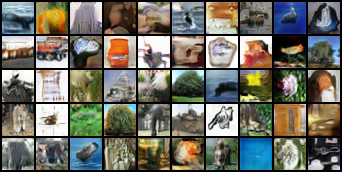

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.66it/s]
782it [01:07, 11.64it/s]


Epoch 35
Loss Total : 4.973689091098888 		 Loss D : 1.4810043557373154 		 Loss G : 3.492684735361572 		 FID : 103.63293177094977 		 Inception Score : 5.940817356109619 (0.12471138685941696)


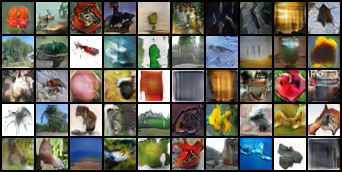

100%|█████████████████████████████████████████| 782/782 [07:05<00:00,  1.84it/s]
782it [00:53, 14.49it/s]
782it [01:07, 11.61it/s]


Epoch 36
Loss Total : 4.95863011608953 		 Loss D : 1.479340124618062 		 Loss G : 3.4792899914714686 		 FID : 102.79824693214908 		 Inception Score : 6.054528713226318 (0.16797202825546265)


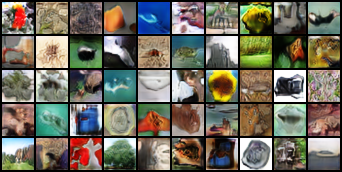

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.66it/s]
782it [01:07, 11.60it/s]


Epoch 37
Loss Total : 4.945865154418799 		 Loss D : 1.439398660226856 		 Loss G : 3.506466494191943 		 FID : 102.66367056825027 		 Inception Score : 6.142233848571777 (0.10950110852718353)


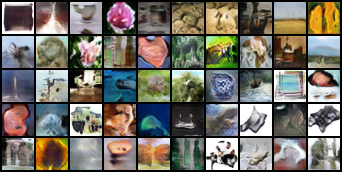

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.56it/s]
782it [01:07, 11.51it/s]


Epoch 38
Loss Total : 4.9281238454687015 		 Loss D : 1.430241780207895 		 Loss G : 3.4978820652608067 		 FID : 100.85205363359982 		 Inception Score : 6.151174068450928 (0.12099068611860275)


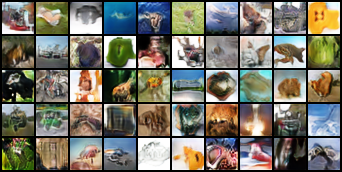

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.58it/s]
782it [01:07, 11.51it/s]


Epoch 39
Loss Total : 4.92706501857399 		 Loss D : 1.4122160823296404 		 Loss G : 3.51484893624435 		 FID : 101.75780497858031 		 Inception Score : 6.274842739105225 (0.17228738963603973)


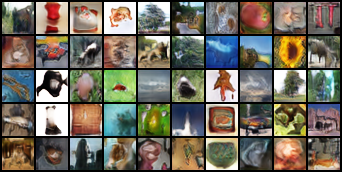

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.63it/s]
782it [01:07, 11.53it/s]


Epoch 40
Loss Total : 4.900918667045091 		 Loss D : 1.3787404269056247 		 Loss G : 3.522178240139466 		 FID : 101.36081992312388 		 Inception Score : 6.209189414978027 (0.07077115029096603)


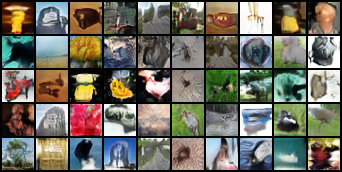

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:54, 14.47it/s]
782it [01:08, 11.47it/s]


Epoch 41
Loss Total : 4.9130711212487475 		 Loss D : 1.380059331121957 		 Loss G : 3.533011790126791 		 FID : 101.72352868322216 		 Inception Score : 6.191222190856934 (0.0556534007191658)


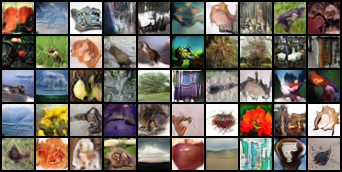

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:54, 14.30it/s]
782it [01:08, 11.42it/s]


Epoch 42
Loss Total : 4.883178537763903 		 Loss D : 1.3571707638328339 		 Loss G : 3.5260077739310693 		 FID : 101.58760256702676 		 Inception Score : 6.1177568435668945 (0.1273341029882431)


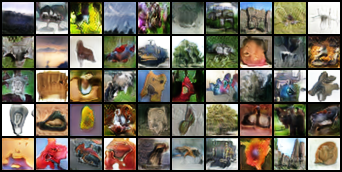

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:54, 14.44it/s]
782it [01:08, 11.48it/s]


Epoch 43
Loss Total : 4.8889549669554775 		 Loss D : 1.337744410461782 		 Loss G : 3.5512105564936958 		 FID : 101.1240550934699 		 Inception Score : 6.251381874084473 (0.15125998854637146)


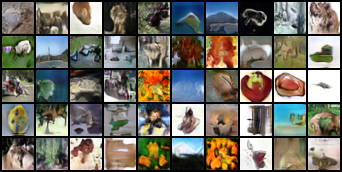

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.51it/s]
782it [01:08, 11.48it/s]


Epoch 44
Loss Total : 4.870319871112819 		 Loss D : 1.313321412143195 		 Loss G : 3.5569984589696237 		 FID : 102.38836825169388 		 Inception Score : 6.280709743499756 (0.1340765357017517)


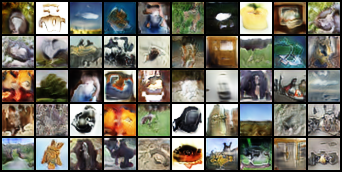

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:54, 14.44it/s]
782it [01:08, 11.42it/s]


Epoch 45
Loss Total : 4.862422583505626 		 Loss D : 1.2963790553610037 		 Loss G : 3.566043528144622 		 FID : 101.7589184808767 		 Inception Score : 6.366858005523682 (0.10240218788385391)


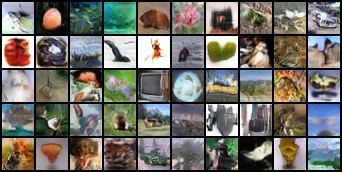

100%|█████████████████████████████████████████| 782/782 [07:05<00:00,  1.84it/s]
782it [00:54, 14.36it/s]
782it [01:08, 11.45it/s]


Epoch 46
Loss Total : 4.858239911477584 		 Loss D : 1.2772324686617498 		 Loss G : 3.5810074428158343 		 FID : 101.33989622780503 		 Inception Score : 6.220288276672363 (0.10567852109670639)


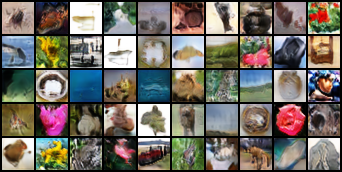

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:54, 14.33it/s]
782it [01:08, 11.43it/s]


Epoch 47
Loss Total : 4.856207444158661 		 Loss D : 1.2757951919837376 		 Loss G : 3.580412252174924 		 FID : 100.67331912024027 		 Inception Score : 6.313435077667236 (0.14346744120121002)


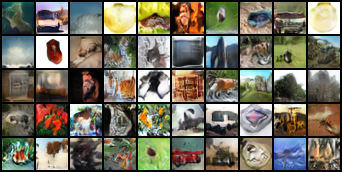

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:54, 14.38it/s]
782it [01:07, 11.51it/s]


Epoch 48
Loss Total : 4.833564562794497 		 Loss D : 1.251888661357143 		 Loss G : 3.5816759014373547 		 FID : 101.02317370565324 		 Inception Score : 6.400233268737793 (0.12758922576904297)


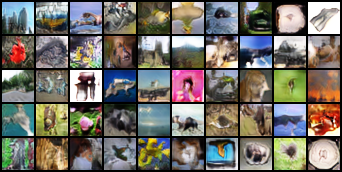

100%|█████████████████████████████████████████| 782/782 [07:09<00:00,  1.82it/s]
782it [00:53, 14.52it/s]
782it [01:07, 11.51it/s]


Epoch 49
Loss Total : 4.842632501479 		 Loss D : 1.2422875847353045 		 Loss G : 3.6003449167436954 		 FID : 100.42623322728568 		 Inception Score : 6.369781970977783 (0.08409027010202408)


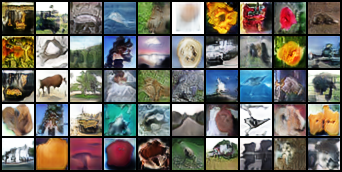

100%|█████████████████████████████████████████| 782/782 [07:09<00:00,  1.82it/s]
782it [00:54, 14.46it/s]
782it [01:08, 11.47it/s]


Epoch 50
Loss Total : 4.81147467556512 		 Loss D : 1.2021454683959942 		 Loss G : 3.6093292071691256 		 FID : 100.20237497167628 		 Inception Score : 6.411118507385254 (0.1303340494632721)


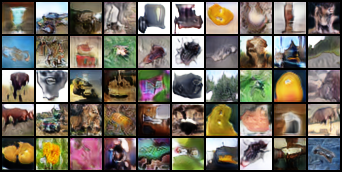

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:54, 14.42it/s]
782it [01:08, 11.43it/s]


Epoch 51
Loss Total : 4.811041991805177 		 Loss D : 1.1902545916912195 		 Loss G : 3.620787400113957 		 FID : 99.93319705007212 		 Inception Score : 6.429014682769775 (0.19960926473140717)


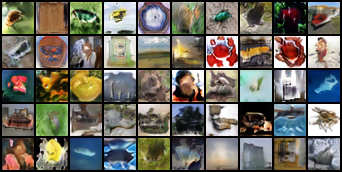

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:54, 14.45it/s]
782it [01:08, 11.47it/s]


Epoch 52
Loss Total : 4.780531444741637 		 Loss D : 1.1654519241331789 		 Loss G : 3.6150795206084583 		 FID : 100.85304865360315 		 Inception Score : 6.416134834289551 (0.0654662624001503)


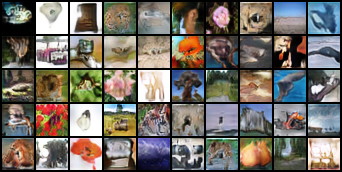

100%|█████████████████████████████████████████| 782/782 [07:09<00:00,  1.82it/s]
782it [00:54, 14.44it/s]
782it [01:08, 11.48it/s]


Epoch 53
Loss Total : 4.794458930983263 		 Loss D : 1.164222680013198 		 Loss G : 3.6302362509700647 		 FID : 100.80229477445448 		 Inception Score : 6.4026947021484375 (0.13804738223552704)


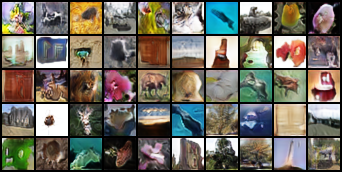

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:54, 14.29it/s]
782it [01:07, 11.53it/s]


Epoch 54
Loss Total : 4.777654866352106 		 Loss D : 1.133464124730176 		 Loss G : 3.6441907416219297 		 FID : 100.70849946537413 		 Inception Score : 6.4582343101501465 (0.06053191050887108)


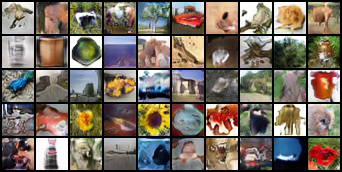

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.52it/s]
782it [01:07, 11.54it/s]


Epoch 55
Loss Total : 4.7746691368424985 		 Loss D : 1.1331685991848217 		 Loss G : 3.641500537657677 		 FID : 100.0015304128956 		 Inception Score : 6.417448997497559 (0.12985482811927795)


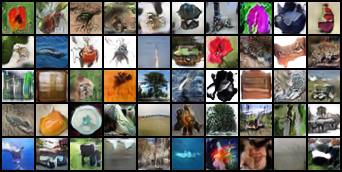

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:53, 14.59it/s]
782it [01:07, 11.57it/s]


Epoch 56
Loss Total : 4.761999395421094 		 Loss D : 1.107968007131001 		 Loss G : 3.654031388290093 		 FID : 101.06282259582572 		 Inception Score : 6.347247123718262 (0.16925941407680511)


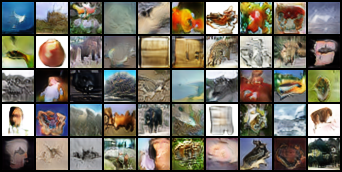

100%|█████████████████████████████████████████| 782/782 [07:09<00:00,  1.82it/s]
782it [00:53, 14.54it/s]
782it [01:07, 11.50it/s]


Epoch 57
Loss Total : 4.738952878491043 		 Loss D : 1.086785326223544 		 Loss G : 3.652167552267499 		 FID : 99.8155682363948 		 Inception Score : 6.397179126739502 (0.10287295281887054)


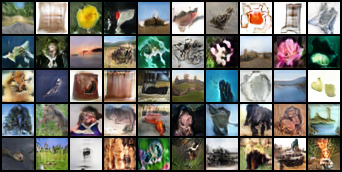

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.67it/s]
782it [01:07, 11.54it/s]


Epoch 58
Loss Total : 4.731904689155881 		 Loss D : 1.0798638530094604 		 Loss G : 3.6520408361464205 		 FID : 99.35679487283369 		 Inception Score : 6.4044318199157715 (0.15685908496379852)


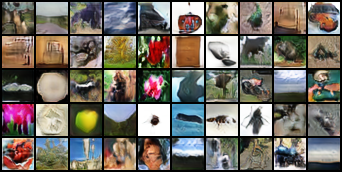

100%|█████████████████████████████████████████| 782/782 [07:09<00:00,  1.82it/s]
782it [00:53, 14.53it/s]
782it [01:08, 11.46it/s]


Epoch 59
Loss Total : 4.718675430930789 		 Loss D : 1.0492503766513541 		 Loss G : 3.6694250542794347 		 FID : 100.0775760304259 		 Inception Score : 6.5135321617126465 (0.1318875104188919)


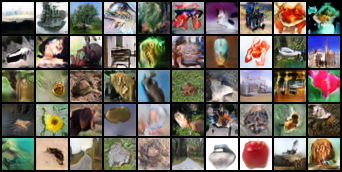

100%|█████████████████████████████████████████| 782/782 [07:09<00:00,  1.82it/s]
782it [00:54, 14.41it/s]
782it [01:08, 11.42it/s]


Epoch 60
Loss Total : 4.719885579917742 		 Loss D : 1.0452721336918414 		 Loss G : 3.6746134462259006 		 FID : 97.56770946231121 		 Inception Score : 6.610166072845459 (0.12428873032331467)


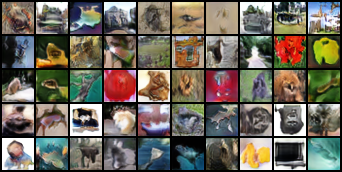

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:54, 14.38it/s]
782it [01:08, 11.48it/s]


Epoch 61
Loss Total : 4.510074108839035 		 Loss D : 0.8417868587519507 		 Loss G : 3.6682872500870842 		 FID : 99.00977550707077 		 Inception Score : 6.545696258544922 (0.06822533905506134)


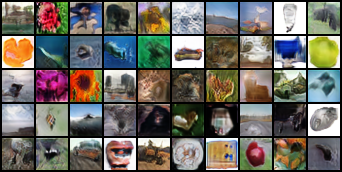

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:54, 14.47it/s]
782it [01:07, 11.52it/s]


Epoch 62
Loss Total : 4.5119500459764925 		 Loss D : 0.8112887824740251 		 Loss G : 3.700661263502467 		 FID : 100.15125596252871 		 Inception Score : 6.519222259521484 (0.11067552864551544)


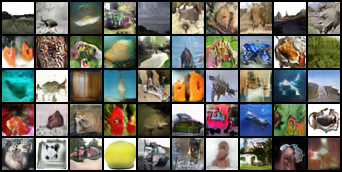

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.49it/s]
782it [01:07, 11.55it/s]


Epoch 63
Loss Total : 4.487904045283032 		 Loss D : 0.8047050752908068 		 Loss G : 3.6831989699922256 		 FID : 98.35245029962428 		 Inception Score : 6.5283660888671875 (0.08154626935720444)


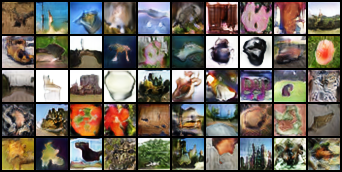

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.60it/s]
782it [01:07, 11.58it/s]


Epoch 64
Loss Total : 4.481757176501672 		 Loss D : 0.8023571440630861 		 Loss G : 3.6794000324385854 		 FID : 99.60152828720814 		 Inception Score : 6.515699863433838 (0.09091690182685852)


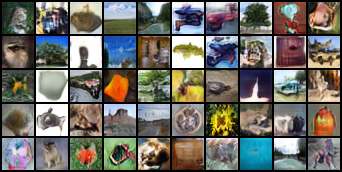

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.82it/s]
782it [00:54, 14.46it/s]
782it [01:07, 11.54it/s]


Epoch 65
Loss Total : 4.468771055226436 		 Loss D : 0.7849941738426228 		 Loss G : 3.683776881383813 		 FID : 98.4030844230692 		 Inception Score : 6.444957733154297 (0.10709178447723389)


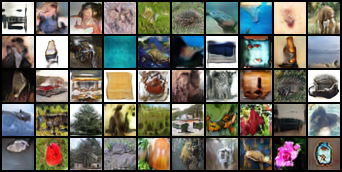

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.53it/s]
782it [01:07, 11.53it/s]


Epoch 66
Loss Total : 4.4696302804571895 		 Loss D : 0.7844209720182906 		 Loss G : 3.685209308438899 		 FID : 99.11284527188381 		 Inception Score : 6.466507911682129 (0.12265963852405548)


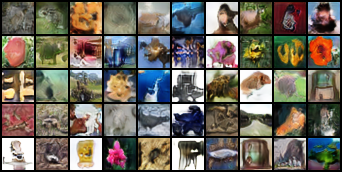

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.57it/s]
782it [01:07, 11.57it/s]


Epoch 67
Loss Total : 4.456006540438098 		 Loss D : 0.7672153821839091 		 Loss G : 3.6887911582541895 		 FID : 98.99169228713298 		 Inception Score : 6.5955352783203125 (0.11154775321483612)


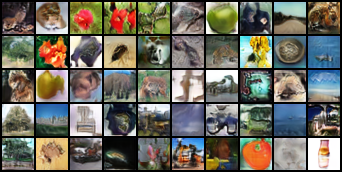

100%|█████████████████████████████████████████| 782/782 [07:09<00:00,  1.82it/s]
782it [00:53, 14.59it/s]
782it [01:07, 11.58it/s]


Epoch 68
Loss Total : 4.4580990792159225 		 Loss D : 0.7694913657653667 		 Loss G : 3.688607713450556 		 FID : 99.920429616956 		 Inception Score : 6.6004462242126465 (0.13187344372272491)


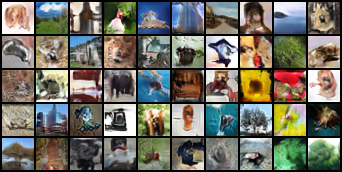

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:54, 14.40it/s]
782it [01:07, 11.53it/s]


Epoch 69
Loss Total : 4.446044151435423 		 Loss D : 0.7525870720748706 		 Loss G : 3.6934570793605523 		 FID : 99.98405592093317 		 Inception Score : 6.531455993652344 (0.11140886694192886)


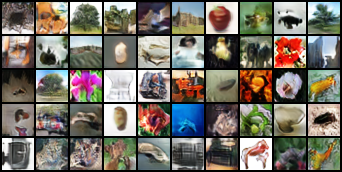

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.58it/s]
782it [01:07, 11.53it/s]


Epoch 70
Loss Total : 4.433943529949164 		 Loss D : 0.7410351218622359 		 Loss G : 3.692908408086928 		 FID : 99.88438582655678 		 Inception Score : 6.605360507965088 (0.10506593436002731)


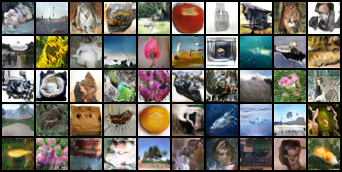

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:54, 14.39it/s]
782it [01:08, 11.39it/s]


Epoch 71
Loss Total : 4.4318781484423395 		 Loss D : 0.7362542073135181 		 Loss G : 3.695623941128821 		 FID : 99.88210927009439 		 Inception Score : 6.578171730041504 (0.09854670614004135)


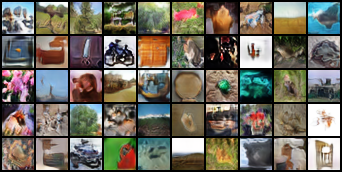

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:54, 14.46it/s]
782it [01:08, 11.44it/s]


Epoch 72
Loss Total : 4.430373525070717 		 Loss D : 0.7325052590016514 		 Loss G : 3.697868266069066 		 FID : 100.73210638824654 		 Inception Score : 6.540715217590332 (0.06177143380045891)


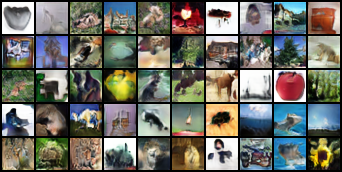

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:53, 14.50it/s]
782it [01:08, 11.49it/s]


Epoch 73
Loss Total : 4.423371495912447 		 Loss D : 0.7213086607434865 		 Loss G : 3.7020628351689604 		 FID : 100.99827087309056 		 Inception Score : 6.577155113220215 (0.09639489650726318)


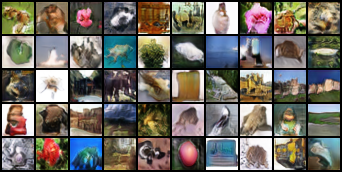

100%|█████████████████████████████████████████| 782/782 [07:09<00:00,  1.82it/s]
782it [00:53, 14.56it/s]
782it [01:07, 11.51it/s]


Epoch 74
Loss Total : 4.4145136432879415 		 Loss D : 0.7080474700159429 		 Loss G : 3.706466173271999 		 FID : 99.93133639305708 		 Inception Score : 6.599761009216309 (0.06554944813251495)


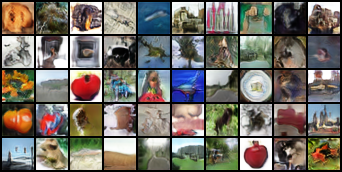

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.83it/s]
782it [00:54, 14.46it/s]
782it [01:08, 11.42it/s]


Epoch 75
Loss Total : 4.408060959042491 		 Loss D : 0.6986796296084933 		 Loss G : 3.7093813294339975 		 FID : 98.99253466686 		 Inception Score : 6.484217643737793 (0.07824785262346268)


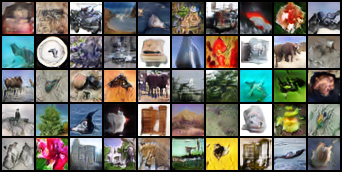

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:54, 14.41it/s]
782it [01:08, 11.43it/s]


Epoch 76
Loss Total : 4.403298429134861 		 Loss D : 0.699633128731452 		 Loss G : 3.7036653004034097 		 FID : 100.84532411841838 		 Inception Score : 6.515372276306152 (0.13596834242343903)


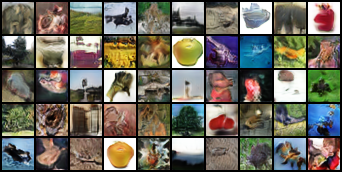

100%|█████████████████████████████████████████| 782/782 [07:09<00:00,  1.82it/s]
782it [00:54, 14.37it/s]
782it [01:08, 11.46it/s]


Epoch 77
Loss Total : 4.3959467741077205 		 Loss D : 0.691430101995273 		 Loss G : 3.704516672112448 		 FID : 101.31192355361136 		 Inception Score : 6.514966011047363 (0.10863365978002548)


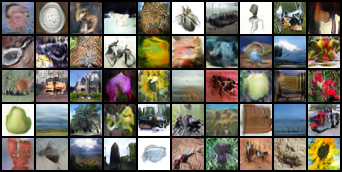

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:54, 14.43it/s]
782it [01:08, 11.48it/s]


Epoch 78
Loss Total : 4.395654908150358 		 Loss D : 0.6767602051462969 		 Loss G : 3.7188947030040613 		 FID : 101.80195406304044 		 Inception Score : 6.433467864990234 (0.127378910779953)


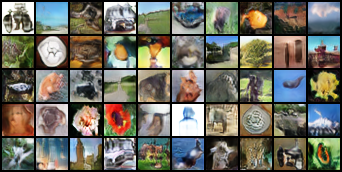

100%|█████████████████████████████████████████| 782/782 [07:07<00:00,  1.83it/s]
782it [00:53, 14.52it/s]
782it [01:07, 11.57it/s]


Epoch 79
Loss Total : 4.382550873338719 		 Loss D : 0.6709220829369772 		 Loss G : 3.7116287904017415 		 FID : 100.20427547870241 		 Inception Score : 6.458258152008057 (0.10987167060375214)


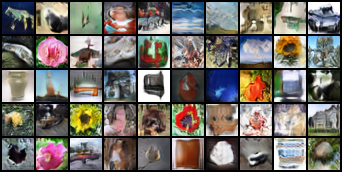

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.51it/s]
782it [01:07, 11.53it/s]


Epoch 80
Loss Total : 4.383250354119884 		 Loss D : 0.661124008924455 		 Loss G : 3.722126345195429 		 FID : 99.61543336277023 		 Inception Score : 6.476479530334473 (0.08125391602516174)


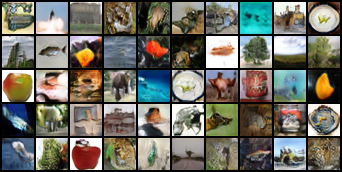

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.49it/s]
782it [01:07, 11.51it/s]


Epoch 81
Loss Total : 4.37125325606912 		 Loss D : 0.6451891396204223 		 Loss G : 3.7260641164486974 		 FID : 99.74520709481227 		 Inception Score : 6.4817304611206055 (0.14275725185871124)


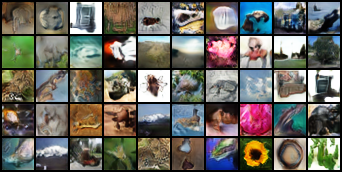

100%|█████████████████████████████████████████| 782/782 [07:06<00:00,  1.83it/s]
782it [00:53, 14.52it/s]
782it [01:07, 11.53it/s]


Epoch 82
Loss Total : 4.363935338566675 		 Loss D : 0.6329662257143299 		 Loss G : 3.7309691128523452 		 FID : 99.16681098175249 		 Inception Score : 6.505402565002441 (0.0662732869386673)


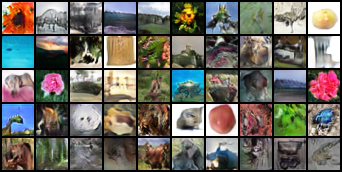

100%|█████████████████████████████████████████| 782/782 [07:08<00:00,  1.82it/s]
782it [00:54, 14.47it/s]
782it [01:08, 11.50it/s]


Epoch 83
Loss Total : 4.372032511722097 		 Loss D : 0.6371959955491069 		 Loss G : 3.7348365161729897 		 FID : 99.69754203090136 		 Inception Score : 6.379538059234619 (0.11212674528360367)


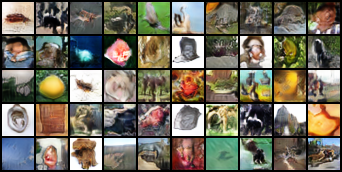

 49%|████████████████████▎                    | 387/782 [03:33<03:34,  1.84it/s]

In [ ]:
torch.autograd.set_detect_anomaly(True)
best_loss = np.inf
best_fid = np.inf
best_inception_score = 0
for epoch in range(1, num_epochs + 1) :
    train_loss, train_fid, train_inception_score, train_inception_score_std = train(netG, netD, epoch, train_loader, optimizerD, optimizerG, device)
    if train_fid < best_fid :
        best_fid = train_fid
        torch.save(netG.state_dict(), 'best_netG.pth')
        torch.save(netD.state_dict(), 'best_netD.pth')
    img = Image.open(os.path.join(sample_dir, f'epoch_{epoch}.png'))
    display(img)
    schedulerD.step()
    schedulerG.step()

In [ ]:
netG = Generator(latent_dim=nz, num_classes=num_classes, ch=64, use_attn=True).to(device)
netD = Discriminator(num_classes=num_classes, ch=64, use_attn=True).to(device)
netG.load_state_dict(torch.load('best_netG.pth'))
netD.load_state_dict(torch.load('best_netD.pth'))

metrics, intra_fid = test(netG, netD, train_loader, device)
print(f'FID : {metrics["FID"]} \t\t Intra-FID : {metrics["Intra-FID Mean"]} ({metrics["Intra-FID Std"]}) \t\t Inception Score : {metrics["Inception Score"]} ({metrics["Inception Score Std"]}) ')

for i, fid_superclass in enumerate(intra_fid) : print(f'Superclass {i} : {fid_superclass}')

In [ ]:
print(metrics)